In [ ]:
from google.colab import files
files.upload()

In [ ]:
!unzip dataset_balanced.zip

Archive:  dataset_balanced.zip
replace images_balanced/000000541293.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: images_balanced/000000541293.jpg  
  inflating: images_balanced/000000398200.jpg  
  inflating: images_balanced/000000435908.jpg  
  inflating: images_balanced/000000545072.jpg  
  inflating: images_balanced/000000386694.jpg  
  inflating: images_balanced/000000504917.jpg  
  inflating: images_balanced/000000051258.jpg  
  inflating: images_balanced/000000345218.jpg  
  inflating: images_balanced/000000168521.jpg  
  inflating: images_balanced/000000281040.jpg  
  inflating: images_balanced/000000251367.jpg  
  inflating: images_balanced/000000039747.jpg  
  inflating: images_balanced/000000380539.jpg  
  inflating: images_balanced/000000437117.jpg  
  inflating: images_balanced/000000440763.jpg  
  inflating: images_balanced/000000229960.jpg  
  inflating: images_balanced/000000365822.jpg  
  inflating: images_balanced/000000160181.jpg  
  inflating: images_bal

List All Files & Folders in Current Directory

In [ ]:
import os                      # import os module for interacting with system

print(os.listdir())           # print all files and folders in current directory

['.config', 'labels_balanced', 'dataset_balanced.zip', 'images_balanced', 'sample_data']


Organize Dataset into YOLO Training Structure

In [ ]:
import os                      # import os module for file handling
import shutil                  # import shutil for copying files

os.makedirs("dataset/images/train", exist_ok=True)   # create train images folder
os.makedirs("dataset/labels/train", exist_ok=True)   # create train labels folder

# copy images
for file in os.listdir("images_balanced"):   # loop through balanced images folder
    shutil.copy(f"images_balanced/{file}", f"dataset/images/train/{file}")
    # copy each image into dataset/images/train

# copy labels
for file in os.listdir("labels_balanced"):   # loop through balanced labels folder
    shutil.copy(f"labels_balanced/{file}", f"dataset/labels/train/{file}")
    # copy each label into dataset/labels/train

print("Dataset structured!")   # confirmation message

Dataset structured!


Create YOLO Data Configuration File (data.yaml)

In [ ]:
data_yaml = """                # define YAML content as a multi-line string
train: dataset/images/train   # path to training images

nc: 2                         # number of classes (person, chair)
names: ['person', 'chair']    # class names
"""

with open("data.yaml", "w") as f:   # create/open data.yaml file in write mode
    f.write(data_yaml)              # write YAML content into the file

print("data.yaml created")          # confirmation message

data.yaml created


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 37.9 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")  # small, fast, good for our case

In [ ]:
import os

os.makedirs("dataset/images/val", exist_ok=True)
os.makedirs("dataset/labels/val", exist_ok=True)

Split Dataset into Train & Validation (80/20)

In [ ]:
import random        # import random for shuffling
import shutil        # import shutil for moving files

images = os.listdir("dataset/images/train")   # get all training image file names

random.shuffle(images)   # shuffle images randomly to avoid bias

split = int(0.8 * len(images))   # calculate 80% split index
train_imgs = images[:split]      # first 80% → training (kept as is)
val_imgs = images[split:]        # last 20% → validation

for img in val_imgs:   # loop through validation images
    # move image
    shutil.move(f"dataset/images/train/{img}", f"dataset/images/val/{img}")
    # move image file to validation folder

    # move label
    label = img.replace(".jpg", ".txt")
    # get corresponding label file name

    shutil.move(f"dataset/labels/train/{label}", f"dataset/labels/val/{label}")
    # move label file to validation folder

print("Train/Val split done!")   # confirmation message

Train/Val split done!


Update YOLO Data Config with Train & Validation Paths

In [ ]:
data_yaml = """                # define YAML content as multi-line string
train: dataset/images/train   # path to training images
val: dataset/images/val       # path to validation images

nc: 2                         # number of classes
names: ['person', 'chair']    # class names
"""

with open("data.yaml", "w") as f:   # open/create data.yaml file
    f.write(data_yaml)              # write updated config into file

print("Fixed data.yaml")            # confirmation message

Fixed data.yaml


Train YOLO Model with Custom Dataset

In [ ]:
model.train(                 # start training the YOLO model
    data="data.yaml",        # path to dataset config file
    epochs=30,               # number of training iterations (full dataset passes)
    imgsz=640,               # image size (resized to 640x640)
    batch=16,                # number of images processed at once
    lr0=0.01                 # initial learning rate (controls learning speed)
)

Ultralytics 8.4.41 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train-2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, 

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79ad54c17500>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

Check Training Output Files (Runs Folder)

In [ ]:
import os                                  # import os for file handling

print(os.listdir("runs/detect/train"))     # list all files generated after training

['weights', 'args.yaml']


List All YOLO Training Runs

In [ ]:
import os

print(os.listdir("runs/detect"))

['train-2', 'train']


In [ ]:
print(os.listdir("runs/detect/train"))

['weights', 'args.yaml']


In [ ]:
import os

print("train:", os.listdir("runs/detect/train"))
print("train-2:", os.listdir("runs/detect/train-2"))

train: ['weights', 'args.yaml']
train-2: ['labels.jpg', 'train_batch601.jpg', 'BoxPR_curve.png', 'confusion_matrix.png', 'val_batch2_pred.jpg', 'BoxF1_curve.png', 'confusion_matrix_normalized.png', 'val_batch0_labels.jpg', 'results.png', 'train_batch0.jpg', 'val_batch0_pred.jpg', 'train_batch602.jpg', 'val_batch2_labels.jpg', 'results.csv', 'weights', 'BoxP_curve.png', 'args.yaml', 'train_batch2.jpg', 'train_batch600.jpg', 'train_batch1.jpg', 'BoxR_curve.png', 'val_batch1_labels.jpg', 'val_batch1_pred.jpg']


In [ ]:
print(os.listdir("runs/detect/train/weights"))

[]


In [ ]:
!find runs/detect -name "best.pt"

runs/detect/train-2/weights/best.pt


In [ ]:
from ultralytics import YOLO

model = YOLO("runs/detect/train-2/weights/best.pt")

In [ ]:
model.val()

Ultralytics 8.4.41 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2871.8±555.8 MB/s, size: 163.4 KB)
val: Scanning /content/dataset/labels/val.cache... 120 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 120/120 50.3Mit/s 0.0s
val: /content/dataset/images/val/000000015851.jpg: 15 duplicate labels removed
val: /content/dataset/images/val/000000016526.jpg: 2 duplicate labels removed
val: /content/dataset/images/val/000000017766.jpg: 14 duplicate labels removed
val: /content/dataset/images/val/000000022102.jpg: 10 duplicate labels removed
val: /content/dataset/images/val/000000026928.jpg: 2 duplicate labels removed
val: /content/dataset/images/val/000000032611.jpg: 7 duplicate labels removed
val: /content/dataset/images/val/000000037198.jpg: 2 duplicate labels removed
val: /content/dataset/images/val/000000044140.jpg: 17 duplicate labels re

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79adc2199bb0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [ ]:
model("https://ultralytics.com/images/bus.jpg", show=True)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()


image 1/1 /content/bus.jpg: 640x480 4 persons, 46.3ms
Speed: 15.5ms preprocess, 46.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'person', 1: 'chair'}
 obb: None
 orig_img: array([[[119, 146, 172],
         [121, 148, 174],
         [122, 152, 177],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        [[120, 147, 173],
         [122, 149, 175],
         [123, 153, 178],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        [[123, 150, 176],
         [124, 151, 177],
         [125, 155, 180],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        ...,
 
        [[183, 182, 186],
         [179, 178, 182],
         [180, 179, 183],
         ...,
         [121, 111, 117],
         [113, 103, 109],
         [115, 105, 111]],
 
        [[165, 164, 168],
         [173, 172, 176],
         [187, 186, 190],
         ...,
      

In [ ]:
from google.colab import files
files.upload()

Saving test.jpg to test.jpg


{'test.jpg': b'\xff\xd8\xff\xe1\x9ccExif\x00\x00II*\x00\x08\x00\x00\x00\x13\x00\x00\x01\x03\x00\x01\x00\x00\x000\x07\x00\x00 \x02\x04\x00\x01\x00\x00\x00\x00\x00\x00\x00\x01\x01\x03\x00\x01\x00\x00\x00\xf0\x0f\x00\x00!\x02\x04\x00\x01\x00\x00\x00\x00\x00\x00\x00"\x02\x04\x00\x01\x00\x00\x00\x00\x00\x00\x00#\x02\x04\x00\x01\x00\x00\x00\x00\x00\x00\x00$\x02\x04\x00\x01\x00\x00\x00\x00\x00\x00\x00%\x02\x02\x00 \x00\x00\x00\xf2\x00\x00\x00(\x01\x03\x00\x01\x00\x00\x00\x02\x00\x00\x00\x0e\x01\x02\x00 \x00\x00\x00\x12\x01\x00\x00\x0f\x01\x02\x00\x07\x00\x00\x002\x01\x00\x00\x10\x01\x02\x00\x0b\x00\x00\x009\x01\x00\x001\x01\x02\x00 \x00\x00\x00D\x01\x00\x00\x12\x01\x03\x00\x01\x00\x00\x00\x00\x00\x00\x002\x01\x02\x00\x14\x00\x00\x00d\x01\x00\x00\x13\x02\x03\x00\x01\x00\x00\x00\x02\x00\x00\x00i\x87\x04\x00\x01\x00\x00\x00\x88\x01\x00\x00\x1a\x01\x05\x00\x01\x00\x00\x00x\x01\x00\x00\x1b\x01\x05\x00\x01\x00\x00\x00\x80\x01\x00\x00\xe5\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

In [ ]:
from ultralytics import YOLO

model = YOLO("runs/detect/train-2/weights/best.pt")

In [ ]:
from google.colab import files
files.upload()

Saving test.jpg to test (1).jpg


{'test (1).jpg': b'\xff\xd8\xff\xe1\x9ccExif\x00\x00II*\x00\x08\x00\x00\x00\x13\x00\x00\x01\x03\x00\x01\x00\x00\x000\x07\x00\x00 \x02\x04\x00\x01\x00\x00\x00\x00\x00\x00\x00\x01\x01\x03\x00\x01\x00\x00\x00\xf0\x0f\x00\x00!\x02\x04\x00\x01\x00\x00\x00\x00\x00\x00\x00"\x02\x04\x00\x01\x00\x00\x00\x00\x00\x00\x00#\x02\x04\x00\x01\x00\x00\x00\x00\x00\x00\x00$\x02\x04\x00\x01\x00\x00\x00\x00\x00\x00\x00%\x02\x02\x00 \x00\x00\x00\xf2\x00\x00\x00(\x01\x03\x00\x01\x00\x00\x00\x02\x00\x00\x00\x0e\x01\x02\x00 \x00\x00\x00\x12\x01\x00\x00\x0f\x01\x02\x00\x07\x00\x00\x002\x01\x00\x00\x10\x01\x02\x00\x0b\x00\x00\x009\x01\x00\x001\x01\x02\x00 \x00\x00\x00D\x01\x00\x00\x12\x01\x03\x00\x01\x00\x00\x00\x00\x00\x00\x002\x01\x02\x00\x14\x00\x00\x00d\x01\x00\x00\x13\x02\x03\x00\x01\x00\x00\x00\x02\x00\x00\x00i\x87\x04\x00\x01\x00\x00\x00\x88\x01\x00\x00\x1a\x01\x05\x00\x01\x00\x00\x00x\x01\x00\x00\x1b\x01\x05\x00\x01\x00\x00\x00\x80\x01\x00\x00\xe5\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

In [ ]:
import os
print(os.listdir())

['.config', 'labels_balanced', 'dataset', 'yolov8n.pt', 'data.yaml', 'test (1).jpg', 'runs', 'dataset_balanced.zip', 'test.jpg', 'yolo26n.pt', 'IMG_20250809_145333.jpg', 'images_balanced', 'bus.jpg', 'sample_data']


In [ ]:
model("test.jpg", show=True)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()


image 1/1 /content/test.jpg: 640x320 1 person, 49.5ms
Speed: 2.3ms preprocess, 49.5ms inference, 17.2ms postprocess per image at shape (1, 3, 640, 320)


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'person', 1: 'chair'}
 obb: None
 orig_img: array([[[ 99, 101, 112],
         [ 95,  99, 110],
         [109, 113, 124],
         ...,
         [ 65,  70,  85],
         [ 36,  39,  54],
         [ 82,  85, 100]],
 
        [[ 99, 101, 112],
         [ 96, 100, 111],
         [103, 109, 120],
         ...,
         [ 72,  77,  92],
         [ 38,  41,  56],
         [ 51,  54,  69]],
 
        [[105, 107, 118],
         [102, 106, 117],
         [102, 108, 119],
         ...,
         [ 77,  82,  97],
         [ 51,  56,  71],
         [ 46,  51,  66]],
 
        ...,
 
        [[202, 191, 187],
         [203, 192, 188],
         [203, 192, 188],
         ...,
         [203, 191, 185],
         [204, 192, 186],
         [209, 197, 191]],
 
        [[203, 192, 188],
         [203, 192, 188],
         [202, 191, 187],
         ...,
      


image 1/1 /content/test.jpg: 640x320 1 person, 13.5ms
Speed: 3.0ms preprocess, 13.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 320)


(np.float64(-0.5), np.float64(1839.5), np.float64(4079.5), np.float64(-0.5))

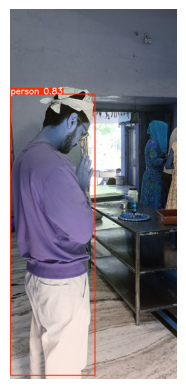

In [ ]:
from ultralytics import YOLO      # import YOLO model
from PIL import Image             # import PIL (not used here directly)
import matplotlib.pyplot as plt   # import matplotlib for displaying image
model = YOLO("runs/detect/train-2/weights/best.pt") #our model

results = model("test.jpg")       # run model on test image → get predictions

# get plotted image
img = results[0].plot()           # draw bounding boxes + labels on image

plt.imshow(img)                   # display image with detections
plt.axis('off')                  # hide axes for clean output

Estimate Distance from Bounding Box (Simple Depth Approximation)

In [ ]:
def estimate_distance(box, class_id):
    # Function to estimate how far an object is from the camera

    # bounding box coordinates (top-left and bottom-right)
    x1, y1, x2, y2 = box

    # calculate width of object in image (in pixels)
    pixel_width = x2 - x1

    # assign approximate real-world width based on object type
    if class_id == 0:   # person
        real_width = 0.5   # average width of a person in meters
    else:               # chair
        real_width = 0.7   # average width of a chair in meters

    # camera focal length (assumed constant for calculation)
    focal_length = 700

    # apply formula to estimate distance from camera
    distance = (real_width * focal_length) / pixel_width

    # return distance rounded to 2 decimal places
    return round(distance, 2)

Heading: Navigation Decision Based on Object Position

In [ ]:
def get_navigation(x_center, img_width):  # function to decide movement direction

if x_center < img_width * 0.4:  # object is on left side of screen
    return "MOVE RIGHT"  # move right to avoid it

elif x_center > img_width * 0.6:  # object is on right side of screen
    return "MOVE LEFT"  # move left to avoid it

else:  # object is in center
    return "STOP / OBSTACLE AHEAD"  # stop as obstacle is directly ahead

Heading: Object Detection, Distance Estimation, and Navigation Output

In [ ]:
import cv2  # import OpenCV library
results = model("test.jpg")  # run object detection on image
img = results[0].plot()  # draw detected boxes on image
boxes = results[0].boxes.xyxy.cpu().numpy()  # get bounding boxes
classes = results[0].boxes.cls.cpu().numpy()  # get class IDs
h, w, _ = img.shape  # get image height and width
for box, cls in zip(boxes, classes):  # loop through each detected object
    x1, y1, x2, y2 = box  # extract box coordinates

    cx = (x1 + x2) / 2  # find center x of object

    dist = estimate_distance(box, int(cls))  # calculate distance

    nav = get_navigation(cx, w)  # decide navigation direction

    print(f"Object: {model.names[int(cls)]}")  # print object name

    print(f"Distance: {dist} meters")  # print distance

    print(f"Navigation: {nav}")  # print navigation action

    print("------")  # separator for readability


image 1/1 /content/test.jpg: 640x320 1 person, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 320)
Object: person
Distance: 0.3799999952316284 meters
Navigation: MOVE RIGHT
------


In [ ]:
!pip install gTTS

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 kB 9.9 MB/s eta 0:00:00
  Attempting uninstall: click
    Found existing installation: click 8.3.2
    Uninstalling click-8.3.2:
      Successfully uninstalled click-8.3.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
typer 0.24.1 requires click>=8.2.1, but you have click 8.1.8 which is incompatible.


Convert Text to Speech and Play Audio

In [ ]:
from gtts import gTTS  # import text-to-speech library
from IPython.display import Audio  # import audio player for notebook

def speak(text):  # function to convert text into speech

    tts = gTTS(text=text, lang='en')  # create speech from text

    tts.save("output.mp3")  # save audio file

    return Audio("output.mp3", autoplay=True)  # play audio automatically

In [ ]:
audio = speak(f"{model.names[int(cls)]} detected at {dist} meters. {nav}")
audio

Object Detection with Voice Navigation Output

In [ ]:
results = model("test.jpg")  # run detection on image

boxes = results[0].boxes.xyxy.cpu().numpy()  # get bounding boxes

classes = results[0].boxes.cls.cpu().numpy()  # get class IDs

for box, cls in zip(boxes, classes):  # loop through detected objects

    dist = estimate_distance(box, int(cls))  # calculate distance

    nav = get_navigation((box[0]+box[2])/2, results[0].orig_shape[1])  # decide navigation

    text = f"{model.names[int(cls)]} detected at {dist} meters. {nav}"  # create message

    print(text)  # display message

    speak(text)  # convert message to speech


image 1/1 /content/test.jpg: 640x320 1 person, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 320)
person detected at 0.3799999952316284 meters. MOVE RIGHT


In [ ]:
!pip install gradio opencv-python gTTS

INFO: pip is looking at multiple versions of typer to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 4.9 MB/s eta 0:00:00
  Attempting uninstall: typer
    Found existing installation: typer 0.24.1
    Uninstalling typer-0.24.1:
      Successfully uninstalled typer-0.24.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
typer-slim 0.24.0 requires typer>=0.24.0, but you have typer 0.23.1 which is incompatible.


Smart Navigation Assistant with YOLO, Distance Estimation, and Voice Output (Gradio App)

In [ ]:
import gradio as gr  # UI framework for web app
import cv2  # image processing library
import numpy as np  # numerical operations
from ultralytics import YOLO  # object detection model
from gtts import gTTS  # text-to-speech
import time  # for timing control
import os  # file handling

model = YOLO("best.pt")

def estimate_distance(box, class_id):  # function to estimate distance
    x1, y1, x2, y2 = box  # get box coordinates
    pixel_width = x2 - x1  # width in pixels
    real_width = 0.5 if class_id == 0 else 0.7  # assign real width
    focal_length = 700  # constant value
    distance = (real_width * focal_length) / pixel_width  # distance formula
    return distance  # return distance

def get_navigation(cx, width):  # function to decide direction
    left_bound = width / 3  # left region limit
    right_bound = (2 * width) / 3  # right region limit

    if cx < left_bound:  # object on left
        return "Obstacle on left, please move right"
    elif cx > right_bound:  # object on right
        return "Obstacle on right, please move left"
    else:  # object in center
        return "Obstacle in center, please stop"

def speak(text):  # convert text to speech
    if not text.strip():  # check empty text
        return None
    tts = gTTS(text=text, lang='en')  # create audio
    filename = "voice.mp3"  # file name
    tts.save(filename)  # save audio file
    return filename  # return file path

def process(frame, last_time, last_text):  # main processing function
    if frame is None:  # handle no input
        return None, "No video feed.", None, last_time, last_text

    current_time = time.time()  # get current time

    if current_time - last_time < 10.0:  # skip if time not passed
        return frame, last_text, None, last_time, last_text

    results = model(frame, classes=[0, 56])  # detect only person & chair

    if len(results[0].boxes) == 0:  # no objects detected
        return frame, "Path is clear.", None, current_time, "Path is clear."

    boxes = results[0].boxes.xyxy.cpu().numpy()  # get boxes
    classes = results[0].boxes.cls.cpu().numpy()  # get classes

    h, w, _ = frame.shape  # get frame size
    output_text = ""  # store messages

    for box, cls in zip(boxes, classes):  # loop detections
        cx = (box[0] + box[2]) / 2  # find center
        dist = estimate_distance(box, int(cls))  # distance
        nav = get_navigation(cx, w)  # navigation
        label = model.names[int(cls)]  # object name

        text = f"{label} detected at {dist:.1f} meters. {nav}."  # message
        output_text += text + "\n"  # add to output

    annotated = results[0].plot()  # draw detections on frame

    audio_file = speak(output_text) if output_text else None  # generate voice

    return annotated, output_text, audio_file, current_time, output_text  # return outputs

with gr.Blocks() as app:  # create UI
    gr.Markdown("## 🚶‍♂️ Smart Navigation Assistant")  # title

    last_time_state = gr.State(0.0)  # store last run time
    last_text_state = gr.State("")  # store last message

    with gr.Row():  # layout row
        with gr.Column():  # input column
            with gr.Tabs():  # tabs for input types
                with gr.Tab("Live Webcam"):
                    webcam_input = gr.Image(sources=["webcam"], streaming=True, label="Live Camera Feed")
                with gr.Tab("Upload Image"):
                    upload_input = gr.Image(sources=["upload"], label="Upload Static Image")

        with gr.Column():  # output column
            output_image = gr.Image(label="Detection Viewer")  # show image
            output_info = gr.Textbox(label="Navigation Status")  # show text
            output_audio = gr.Audio(label="Voice Assistant", autoplay=True)  # play audio

    webcam_input.stream(  # process live webcam
        fn=process,
        inputs=[webcam_input, last_time_state, last_text_state],
        outputs=[output_image, output_info, output_audio, last_time_state, last_text_state]
    )

    upload_input.upload(  # process uploaded image
        fn=process,
        inputs=[upload_input, gr.State(0.0), last_text_state],
        outputs=[output_image, output_info, output_audio, last_time_state, last_text_state]
    )

if __name__ == "__main__":
    app.launch()  # run the app

In [ ]:
import gradio as gr
import cv2
import numpy as np
from ultralytics import YOLO
from gtts import gTTS
import time
import os

# Load model
model = YOLO("yolov8n.pt") # Ensure you use your specific path: "runs/detect/train-2/weights/best.pt"

# Distance estimation
def estimate_distance(box, class_id):
    x1, y1, x2, y2 = box
    pixel_width = x2 - x1

    # Assuming class 0 is person, others (like 56 for chair) are objects
    real_width = 0.5 if class_id == 0 else 0.7

    focal_length = 700
    distance = (real_width * focal_length) / pixel_width
    return distance

# Navigation: Strictly divided into 3 equal parts
def get_navigation(cx, width):
    left_bound = width / 3
    right_bound = (2 * width) / 3

    # Using the object's center (cx) to determine its exact zone
    if cx < left_bound:
        return "Obstacle on left, please move right"
    elif cx > right_bound:
        return "Obstacle on right, please move left"
    else:
        return "Obstacle in center, please stop"

# Speech
def speak(text):
    if not text.strip():
        return None

    tts = gTTS(text=text, lang='en')
    filename = "voice.mp3"
    tts.save(filename)
    return filename

# Main pipeline with 5-second throttling
def process(frame, last_time, last_text):
    # Handle empty frames
    if frame is None:
        return None, "No video feed.", None, last_time, last_text

    current_time = time.time()

    # Time Check: If 5 seconds haven't passed, just pass the live frame through
    # so the video doesn't freeze, but DO NOT run YOLO or replay audio.
    if current_time - last_time < 10.0:
        return frame, last_text, None, last_time, last_text

    # --- 5 SECONDS HAVE PASSED: RUN HEAVY DETECTION ---
    # Filter strictly for Person (0) and Chair (56) to meet your requirement
    results = model(frame, classes=[0, 56])

    # Handle clear path
    if len(results[0].boxes) == 0:
        return frame, "Path is clear.", None, current_time, "Path is clear."

    boxes = results[0].boxes.xyxy.cpu().numpy()
    classes = results[0].boxes.cls.cpu().numpy()

    h, w, _ = frame.shape
    output_text = ""

    for box, cls in zip(boxes, classes):
        # Calculate exactly where the center of the object is
        cx = (box[0] + box[2]) / 2

        dist = estimate_distance(box, int(cls))
        nav = get_navigation(cx, w)

        label = model.names[int(cls)]

        # Keep distance to 1 decimal place so it sounds human
        text = f"{label} detected at {dist:.1f} meters. {nav}."
        output_text += text + "\n"

    # Draw boxes only on the detected persons/chairs
    annotated = results[0].plot()

    # Generate new voice file
    audio_file = speak(output_text) if output_text else None

    # Update states with new time and new text
    return annotated, output_text, audio_file, current_time, output_text


# Gradio UI using Blocks for advanced continuous streaming
with gr.Blocks() as app:
    gr.Markdown("## 🚶‍♂️ Smart Navigation Assistant")

    # Hidden states to keep track of the 5-second timer without resetting
    last_time_state = gr.State(0.0)
    last_text_state = gr.State("")

    with gr.Row():
        with gr.Column():
            # FIX: Separate Webcam and Upload into tabs to satisfy Gradio's streaming rules
            with gr.Tabs():
                with gr.Tab("Live Webcam"):
                    webcam_input = gr.Image(sources=["webcam"], streaming=True, label="Live Camera Feed")
                with gr.Tab("Upload Image"):
                    upload_input = gr.Image(sources=["upload"], label="Upload Static Image")

        with gr.Column():
            output_image = gr.Image(label="Detection Viewer")
            output_info = gr.Textbox(label="Navigation Status")
            output_audio = gr.Audio(label="Voice Assistant", autoplay=True)

    # Trigger processing continuously from webcam...
    webcam_input.stream(
        fn=process,
        inputs=[webcam_input, last_time_state, last_text_state],
        outputs=[output_image, output_info, output_audio, last_time_state, last_text_state]
    )

    # ...and also allow standard image uploads to work instantly
    upload_input.upload(
        fn=process,
        # We pass 0.0 for time on an upload so it bypasses the 5-sec timer and processes immediately
        inputs=[upload_input, gr.State(0.0), last_text_state],
        outputs=[output_image, output_info, output_audio, last_time_state, last_text_state]
    )

if __name__ == "__main__":
    app.launch()

It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://b9226a79555a04a7cb.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


# Improving this more

In [ ]:
import gradio as gr
import cv2
import numpy as np
from ultralytics import YOLO
from gtts import gTTS
from IPython.display import Audio

# Load model
model = YOLO("runs/detect/train-2/weights/best.pt")

# Distance estimation
def estimate_distance(box, class_id):
    x1, y1, x2, y2 = box
    pixel_width = x2 - x1

    if class_id == 0:
        real_width = 0.5
    else:
        real_width = 0.7

    focal_length = 700
    distance = (real_width * focal_length) / pixel_width
    return round(distance, 2)

# Navigation
def get_navigation(cx, width):
    if cx < width * 0.4:
        return "MOVE RIGHT"
    elif cx > width * 0.6:
        return "MOVE LEFT"
    else:
        return "STOP"

# Speech
def speak(text):
    tts = gTTS(text=text, lang='en')
    tts.save("voice.mp3")
    return "voice.mp3"

# Main pipeline
def process(frame):
    results = model(frame)

    boxes = results[0].boxes.xyxy.cpu().numpy()
    classes = results[0].boxes.cls.cpu().numpy()

    h, w, _ = frame.shape
    output_text = ""

    for box, cls in zip(boxes, classes):
        cx = (box[0] + box[2]) / 2

        dist = estimate_distance(box, int(cls))
        nav = get_navigation(cx, w)

        label = model.names[int(cls)]
        text = f"{label} at {dist} meters. {nav}"

        output_text += text + "\n"

    # draw boxes
    annotated = results[0].plot()

    # generate voice
    audio_file = speak(output_text) if output_text else None

    return annotated, output_text, audio_file

# Gradio UI
app = gr.Interface(
    fn=process,
    inputs=gr.Image(type="numpy"),
    outputs=[
        gr.Image(label="Detection"),
        gr.Textbox(label="Info"),
        gr.Audio(label="Voice Output")
    ],
    live=True
)

app.launch()

It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://b50f63ad52fb55b19e.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
# global memory for smoothing
prev_distances = {}

def estimate_distance(box, class_id, obj_id):
    x1, y1, x2, y2 = box
    pixel_width = x2 - x1

    real_width = 0.5 if class_id == 0 else 0.7
    focal_length = 700

    distance = (real_width * focal_length) / pixel_width

    # 🔥 smoothing
    if obj_id in prev_distances:
        distance = 0.7 * prev_distances[obj_id] + 0.3 * distance

    prev_distances[obj_id] = distance

    # clean rounding
    return round(distance, 1)

In [ ]:
def make_sentence(label, dist, nav):
    if nav == "STOP":
        action = "Please stop, obstacle ahead."
    elif nav == "MOVE LEFT":
        action = "Please move left."
    else:
        action = "Please move right."

    return f"There is a {label} about {dist} meters ahead. {action}"

In [ ]:
def speak(text):
    tts = gTTS(text=text, lang='en', slow=False)
    tts.save("voice.mp3")
    return "voice.mp3"

In [ ]:
import gradio as gr
import cv2
import numpy as np
from ultralytics import YOLO
from gtts import gTTS
import os

# Load model
model = YOLO("runs/detect/train-2/weights/best.pt")

# Distance estimation
def estimate_distance(box, class_id):
    x1, y1, x2, y2 = box
    pixel_width = x2 - x1

    if class_id == 0:
        real_width = 0.5
    else:
        real_width = 0.7

    focal_length = 700
    distance = (real_width * focal_length) / pixel_width

    # Keeping the math clean, the string formatting later handles the visual/audio truncation
    return distance

# Navigation (Divided exactly into three equal parts)
def get_navigation(cx, width):
    third = width / 3

    if cx < third:
        return "Obstacle left, please move right"
    elif cx > 2 * third:
        return "Obstacle right, please move left"
    else:
        return "Obstacle ahead, please stop"

# Speech
def speak(text):
    if not text.strip():
        return None

    tts = gTTS(text=text, lang='en')
    filename = "voice.mp3"
    tts.save(filename)
    return filename

# Main pipeline
def process(frame):
    # Handle empty frames safely
    if frame is None:
        return None, "No video feed detected.", None

    results = model(frame)

    # Handle cases where path is clear
    if len(results[0].boxes) == 0:
        return frame, "Path is clear.", None

    boxes = results[0].boxes.xyxy.cpu().numpy()
    classes = results[0].boxes.cls.cpu().numpy()

    h, w, _ = frame.shape
    output_text = ""

    for box, cls in zip(boxes, classes):
        cx = (box[0] + box[2]) / 2

        dist = estimate_distance(box, int(cls))
        nav = get_navigation(cx, w)

        label = model.names[int(cls)]

        # Enforcing exactly 1 decimal place (e.g., 2.3) so the TTS sounds human
        text = f"{label} detected at {dist:.1f} meters. {nav}."
        output_text += text + "\n"

    # Draw boxes
    annotated = results[0].plot()

    # Generate voice
    audio_file = speak(output_text) if output_text else None

    return annotated, output_text, audio_file

# Gradio UI
app = gr.Interface(
    fn=process,
    # Allow both continuous webcam and standard file uploads
    inputs=gr.Image(sources=["webcam", "upload"], label="Camera Feed"),
    outputs=[
        gr.Image(label="Detection Viewer"),
        gr.Textbox(label="Navigation Status"),
        gr.Audio(label="Voice Assistant", autoplay=True) # Autoplay ensures hands-free guidance
    ],
    live=True
)

if __name__ == "__main__":
    app.launch()

It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://e48684f26381ffa36c.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
import gradio as gr
import cv2
import numpy as np
from ultralytics import YOLO
from gtts import gTTS
import time
import os

# Load model
model = YOLO("runs/detect/train-2/weights/best.pt")

# -------------------------------
# Distance estimation
# -------------------------------
def estimate_distance(box, class_id):
    x1, y1, x2, y2 = box
    pixel_width = x2 - x1

    real_width = 0.5 if class_id == 0 else 0.7
    focal_length = 700

    if pixel_width == 0:
        return 999

    distance = (real_width * focal_length) / pixel_width
    return distance


# -------------------------------
# Navigation logic (3 zones)
# -------------------------------
def get_navigation(cx, width):
    left_bound = width / 3
    right_bound = (2 * width) / 3

    if cx < left_bound:
        return "Obstacle on left, please move right"
    elif cx > right_bound:
        return "Obstacle on right, please move left"
    else:
        return "Obstacle in center, please stop"


# -------------------------------
# Speech synthesis
# -------------------------------
def speak(text):
    if not text.strip():
        return None

    tts = gTTS(text=text, lang='en')
    filename = "voice.mp3"
    tts.save(filename)
    return filename


# -------------------------------
# Core YOLO pipeline
# -------------------------------
def process(frame, last_time, last_text):
    if frame is None:
        return None, "No video feed.", None, last_time, last_text

    current_time = time.time()

    # Throttle inference (5 sec rule)
    if current_time - last_time < 5.0:
        return frame, last_text, None, last_time, last_text

    results = model(frame)

    # No objects
    if len(results[0].boxes) == 0:
        return frame, "Path is clear.", None, current_time, "Path is clear."

    boxes = results[0].boxes.xyxy.cpu().numpy()
    classes = results[0].boxes.cls.cpu().numpy()

    h, w, _ = frame.shape
    output_text = ""

    for box, cls in zip(boxes, classes):
        cx = (box[0] + box[2]) / 2

        dist = estimate_distance(box, int(cls))
        nav = get_navigation(cx, w)

        label = model.names[int(cls)]

        text = f"{label} detected at {dist:.1f} meters. {nav}."
        output_text += text + "\n"

    annotated = results[0].plot()
    audio_file = speak(output_text) if output_text else None

    return annotated, output_text, audio_file, current_time, output_text


# =========================================================
# GRADIO UI (FIXED STRUCTURE)
# =========================================================
with gr.Blocks() as app:
    gr.Markdown("## 🚶‍♂️ Smart Navigation Assistant")

    last_time_state = gr.State(0.0)
    last_text_state = gr.State("")

    with gr.Row():
        # ✅ STREAMING WEB CAM (ONLY webcam allowed here)
        webcam_input = gr.Image(
            sources=["webcam"],
            streaming=True,
            label="Live Camera Feed"
        )

        output_image = gr.Image(label="Detection Viewer")

    with gr.Row():
        output_info = gr.Textbox(label="Navigation Status")
        output_audio = gr.Audio(label="Voice Assistant", autoplay=True)

    # ---------------------------
    # LIVE WEBCAM STREAM
    # ---------------------------
    webcam_input.stream(
        fn=process,
        inputs=[webcam_input, last_time_state, last_text_state],
        outputs=[output_image, output_info, output_audio, last_time_state, last_text_state]
    )

    # ---------------------------
    # IMAGE UPLOAD (NO STREAMING)
    # ---------------------------
    upload_input = gr.Image(
        sources=["upload"],
        type="numpy",
        label="Upload Image (Instant Detection)"
    )

    upload_btn = gr.Button("Run Detection on Upload")

    upload_btn.click(
        fn=process,
        inputs=[upload_input, last_time_state, last_text_state],
        outputs=[output_image, output_info, output_audio, last_time_state, last_text_state]
    )


if __name__ == "__main__":
    app.launch()

It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://68598610f06ed54ff0.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
import gradio as gr
import cv2
import numpy as np
from ultralytics import YOLO
from gtts import gTTS
import time
import os

# Load model
model = YOLO("runs/detect/train-2/weights/best.pt")

def estimate_distance(box, class_id):
    x1, y1, x2, y2 = box
    pixel_width = x2 - x1
    # Standard widths: Person ~0.5m, Chair/Object ~0.7m
    real_width = 0.5 if class_id == 0 else 0.7
    focal_length = 700
    distance = (real_width * focal_length) / pixel_width
    return distance

def get_navigation(cx, width):
    left_bound = width / 3
    right_bound = (2 * width) / 3
    if cx < left_bound:
        return "on your left"
    elif cx > right_bound:
        return "on your right"
    else:
        return "directly ahead"

def speak(text):
    if not text.strip():
        return None
    # Ensure a fresh audio file
    if os.path.exists("voice.mp3"):
        try: os.remove("voice.mp3")
        except: pass
    tts = gTTS(text=text, lang='en')
    tts.save("voice.mp3")
    return "voice.mp3"

def process(frame, last_time, last_text, last_annotated, is_upload=False):
    if frame is None:
        return None, "No feed", None, last_time, last_text, last_annotated

    current_time = time.time()

    # If 5 seconds haven't passed (and it's not a manual upload), keep showing previous detections
    if not is_upload and (current_time - last_time < 5.0):
        return last_annotated if last_annotated is not None else frame, last_text, None, last_time, last_text, last_annotated

    # --- DETECTION TRIGGERED ---
    results = model(frame)
    annotated_frame = results[0].plot()

    if len(results[0].boxes) == 0:
        return annotated_frame, "Path clear", None, current_time, "Path clear", annotated_frame

    boxes = results[0].boxes.xyxy.cpu().numpy()
    classes = results[0].boxes.cls.cpu().numpy()
    h, w, _ = frame.shape

    detections = []
    for box, cls in zip(boxes, classes):
        cx = (box[0] + box[2]) / 2
        dist = estimate_distance(box, int(cls))
        pos = get_navigation(cx, w)
        label = model.names[int(cls)]
        detections.append(f"A {label}, {pos}, at {dist:.1f} meters.")

    # Combined sentence prevents audio confusion
    full_message = " ".join(detections)
    audio_file = speak(full_message)

    return annotated_frame, full_message, audio_file, current_time, full_message, annotated_frame

# UI Setup - Theme moved back to constructor
with gr.Blocks(theme=gr.themes.Soft()) as app:
    gr.Markdown("# 🚶‍♂️ Smart Navigation Assistant")

    last_time_state = gr.State(0.0)
    last_text_state = gr.State("System Ready")
    last_annotated_state = gr.State(None)

    with gr.Tabs():
        # TAB 1: WEBCAM
        with gr.TabItem("Live Navigation"):
            with gr.Row():
                webcam_input = gr.Image(sources=["webcam"], streaming=True, label="Live Feed")
                live_output = gr.Image(label="Detection View")
            with gr.Row():
                live_info = gr.Textbox(label="Status")
                live_audio = gr.Audio(label="Voice Guidance", autoplay=True)

        # TAB 2: UPLOAD
        with gr.TabItem("Image Analysis"):
            with gr.Row():
                upload_input = gr.Image(sources=["upload"], label="Upload Photo")
                upload_output = gr.Image(label="Analysis View")
            with gr.Row():
                upload_info = gr.Textbox(label="Status")
                upload_audio = gr.Audio(label="Voice Guidance", autoplay=True)

    # Live processing logic
    webcam_input.stream(
        fn=process,
        inputs=[webcam_input, last_time_state, last_text_state, last_annotated_state],
        outputs=[live_output, live_info, live_audio, last_time_state, last_text_state, last_annotated_state],
        show_progress="hidden"
    )

    # Upload processing logic
    upload_input.upload(
        fn=lambda f, lt, lx, la: process(f, 0.0, lx, la, is_upload=True),
        inputs=[upload_input, last_time_state, last_text_state, last_annotated_state],
        outputs=[upload_output, upload_info, upload_audio, last_time_state, last_text_state, last_annotated_state]
    )

if __name__ == "__main__":
    app.launch()

/tmp/ipykernel_12126/1023381362.py:78: DeprecationWarning: The 'theme' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'theme' to Blocks.launch() instead.
  with gr.Blocks(theme=gr.themes.Soft()) as app:


It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://965e183548a94dafba.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
import gradio as gr
import cv2
import numpy as np
from ultralytics import YOLO
from gtts import gTTS
import time
import os

# Load model
model = YOLO("runs/detect/train-2/weights/best.pt")

def estimate_distance(box, class_id):
    x1, y1, x2, y2 = box
    pixel_width = x2 - x1
    real_width = 0.5 if class_id == 0 else 0.7
    focal_length = 700
    return (real_width * focal_length) / pixel_width

def generate_navigation_instruction(occupied_zones):
    """
    Analyzes occupied zones and provides a clear directional command.
    """
    if "center" not in occupied_zones:
        return "Path ahead is clear."

    if "left" not in occupied_zones:
        return "Obstacle ahead, move left."

    if "right" not in occupied_zones:
        return "Obstacle ahead, move right."

    return "All paths blocked, please stop."

def speak(text):
    if not text.strip():
        return None
    if os.path.exists("voice.mp3"):
        try: os.remove("voice.mp3")
        except: pass
    tts = gTTS(text=text, lang='en')
    tts.save("voice.mp3")
    return "voice.mp3"

def process(frame, last_time, last_text, last_annotated, is_upload=False):
    if frame is None:
        return None, "No feed", None, last_time, last_text, last_annotated

    current_time = time.time()

    # Throttle processing to every 5 seconds for live stream
    if not is_upload and (current_time - last_time < 5.0):
        return last_annotated if last_annotated is not None else frame, last_text, None, last_time, last_text, last_annotated

    results = model(frame)
    annotated_frame = results[0].plot()

    if len(results[0].boxes) == 0:
        msg = "Path clear. Keep walking."
        return annotated_frame, msg, speak(msg), current_time, msg, annotated_frame

    boxes = results[0].boxes.xyxy.cpu().numpy()
    classes = results[0].boxes.cls.cpu().numpy()
    h, w, _ = frame.shape

    # Zone boundaries
    left_bound = w / 3
    right_bound = (2 * w) / 3

    zone_data = {"left": [], "center": [], "right": []}

    for box, cls in zip(boxes, classes):
        cx = (box[0] + box[2]) / 2
        dist = estimate_distance(box, int(cls))
        label = model.names[int(cls)]

        if cx < left_bound:
            zone_data["left"].append((label, dist))
        elif cx > right_bound:
            zone_data["right"].append((label, dist))
        else:
            zone_data["center"].append((label, dist))

    # Build Concise Summary
    summary_parts = []
    occupied_zones = []

    for zone in ["left", "center", "right"]:
        if zone_data[zone]:
            occupied_zones.append(zone)
            # Get the unique objects in this zone
            objects = list(set([item[0] for item in zone_data[zone]]))
            # Get minimum distance in this zone for safety
            min_dist = min([item[1] for item in zone_data[zone]])
            summary_parts.append(f"{', '.join(objects)} {zone} at {min_dist:.1f} meters.")

    # Logic-based Command
    nav_command = generate_navigation_instruction(occupied_zones)

    # Final consolidated sentence: [Observation] + [Command]
    full_message = f"{' '.join(summary_parts)} {nav_command}"
    audio_file = speak(full_message)

    return annotated_frame, full_message, audio_file, current_time, full_message, annotated_frame

# UI - Theme back in constructor to avoid launch error
with gr.Blocks(theme=gr.themes.Soft()) as app:
    gr.Markdown("## 🦾 Intelligent Vision Navigator")

    last_time_state = gr.State(0.0)
    last_text_state = gr.State("System Ready")
    last_annotated_state = gr.State(None)

    with gr.Tabs():
        with gr.TabItem("Live Streaming"):
            with gr.Row():
                webcam_input = gr.Image(sources=["webcam"], streaming=True, label="Live Input")
                live_output = gr.Image(label="Navigation Overlay")
            with gr.Row():
                live_info = gr.Textbox(label="Assistant Instruction")
                live_audio = gr.Audio(label="Voice Feed", autoplay=True)

        with gr.TabItem("Manual Upload"):
            with gr.Row():
                upload_input = gr.Image(sources=["upload"], label="Upload Image")
                upload_output = gr.Image(label="Static Analysis")
            with gr.Row():
                upload_info = gr.Textbox(label="Analysis Result")
                upload_audio = gr.Audio(label="Voice Result", autoplay=True)

    webcam_input.stream(
        fn=process,
        inputs=[webcam_input, last_time_state, last_text_state, last_annotated_state],
        outputs=[live_output, live_info, live_audio, last_time_state, last_text_state, last_annotated_state],
        show_progress="hidden"
    )

    upload_input.upload(
        fn=lambda f, lt, lx, la: process(f, 0.0, lx, la, is_upload=True),
        inputs=[upload_input, last_time_state, last_text_state, last_annotated_state],
        outputs=[upload_output, upload_info, upload_audio, last_time_state, last_text_state, last_annotated_state]
    )

if __name__ == "__main__":
    app.launch()

/tmp/ipykernel_12126/2842991081.py:106: DeprecationWarning: The 'theme' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'theme' to Blocks.launch() instead.
  with gr.Blocks(theme=gr.themes.Soft()) as app:


It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://c5e4f726365e1f0765.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
import gradio as gr
import cv2
import numpy as np
from ultralytics import YOLO
from gtts import gTTS
import time
import os

# Load model
model = YOLO("runs/detect/train-2/weights/best.pt")

def estimate_distance(box, class_id):
    x1, y1, x2, y2 = box
    pixel_width = x2 - x1
    # CSE AI/ML Tip: Keep these constants precise
    real_width = 0.5 if class_id == 0 else 0.7
    focal_length = 700
    return (real_width * focal_length) / pixel_width

def get_navigation_instruction(zones, closest_dist):
    """
    Priority-based decision engine.
    """
    # 1. CRITICAL STOP: If objects are everywhere or very close in center
    if "center" in zones:
        if closest_dist < 1.0: # Less than 1 meter is an emergency
            return "Object very close. STOP NOW."

        # 2. NAVIGATE AROUND: Center is blocked, find an opening
        if "left" not in zones:
            return "Obstacle ahead. Please move LEFT."
        if "right" not in zones:
            return "Obstacle ahead. Please move RIGHT."

        return "Path blocked. Please stop."

    # 3. SIDE WARNINGS: Center is clear, but be careful of sides
    if "left" in zones and "right" in zones:
        return "Narrow path. Walk straight carefully."

    return "Path clear. Continue walking."

def speak(text):
    if not text.strip():
        return None

    # Unique filename per update to force Gradio/Browser to refresh the audio
    filename = f"nav_audio_{int(time.time())}.mp3"

    # Cleanup: Delete previous audio files to prevent clutter
    for f in os.listdir():
        if f.startswith("nav_audio_") and f.endswith(".mp3"):
            try: os.remove(f)
            except: pass

    tts = gTTS(text=text, lang='en')
    tts.save(filename)
    return filename

def process(frame, last_time, last_text, last_annotated, is_upload=False):
    if frame is None:
        return None, "No camera feed.", None, last_time, last_text, last_annotated

    current_time = time.time()

    # Wait for the 5-second window for the live stream
    if not is_upload and (current_time - last_time < 5.0):
        return last_annotated if last_annotated is not None else frame, last_text, None, last_time, last_text, last_annotated

    results = model(frame)
    annotated_frame = results[0].plot()

    if len(results[0].boxes) == 0:
        msg = "Path is clear. Continue walking."
        return annotated_frame, msg, speak(msg), current_time, msg, annotated_frame

    boxes = results[0].boxes.xyxy.cpu().numpy()
    classes = results[0].boxes.cls.cpu().numpy()
    h, w, _ = frame.shape

    # Define zones strictly
    left_bound = w / 3
    right_bound = (2 * w) / 3

    occupied_zones = set()
    detected_labels = set()
    min_dist = 100.0

    for box, cls in zip(boxes, classes):
        cx = (box[0] + box[2]) / 2
        dist = estimate_distance(box, int(cls))
        label = model.names[int(cls)]

        # Track the absolute closest thing for the safety logic
        if dist < min_dist:
            min_dist = dist

        detected_labels.add(label)

        if cx < left_bound:
            occupied_zones.add("left")
        elif cx > right_bound:
            occupied_zones.add("right")
        else:
            occupied_zones.add("center")

    # Construct the clear, combined sentence
    objects_found = " and ".join(list(detected_labels))
    instruction = get_navigation_instruction(occupied_zones, min_dist)

    # Final sentence format: "Person detected 1.5 meters away. Obstacle ahead, move left."
    full_message = f"{objects_found} detected {min_dist:.1f} meters away. {instruction}"

    audio_file = speak(full_message)

    return annotated_frame, full_message, audio_file, current_time, full_message, annotated_frame

# UI Setup
with gr.Blocks(theme=gr.themes.Soft()) as app:
    gr.Markdown("## 🦾 Integrated Navigation Assistant")

    # Persistent states
    last_time_state = gr.State(0.0)
    last_text_state = gr.State("Ready")
    last_annotated_state = gr.State(None)

    with gr.Tabs():
        with gr.TabItem("Live Navigation"):
            with gr.Row():
                webcam_input = gr.Image(sources=["webcam"], streaming=True, label="Webcam")
                live_output = gr.Image(label="AI Analysis")
            with gr.Row():
                live_info = gr.Textbox(label="Instruction")
                # Autoplay=True is key for hands-free
                live_audio = gr.Audio(label="Voice Guide", autoplay=True)

        with gr.TabItem("Image Analysis"):
            with gr.Row():
                upload_input = gr.Image(sources=["upload"], label="Upload Image")
                upload_output = gr.Image(label="Detection Results")
            with gr.Row():
                upload_info = gr.Textbox(label="Result")
                upload_audio = gr.Audio(label="Voice Result", autoplay=True)

    webcam_input.stream(
        fn=process,
        inputs=[webcam_input, last_time_state, last_text_state, last_annotated_state],
        outputs=[live_output, live_info, live_audio, last_time_state, last_text_state, last_annotated_state],
        show_progress="hidden"
    )

    upload_input.upload(
        fn=lambda f, lt, lx, la: process(f, 0.0, lx, la, is_upload=True),
        inputs=[upload_input, last_time_state, last_text_state, last_annotated_state],
        outputs=[upload_output, upload_info, upload_audio, last_time_state, last_text_state, last_annotated_state]
    )

if __name__ == "__main__":
    app.launch()

/tmp/ipykernel_12126/3971880323.py:119: DeprecationWarning: The 'theme' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'theme' to Blocks.launch() instead.
  with gr.Blocks(theme=gr.themes.Soft()) as app:


It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://7e0ce2879229b6fe8b.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
pip install streamlit ultralytics opencv-python gtts

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 89.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 101.9 MB/s eta 0:00:00


In [ ]:
from google.colab import files

files.download("runs/detect/train-2/weights/best.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>